
# **1-Planteamiento**


Se dice que una de las capitales del mundo es la ciudad de Nueva York, donde grandes emprendimientos han llegado a la cima de sus éxitos. AirBnB es una de las apps que más se escucha a nivel mundial, usualmente utilizada para encontrar alojamientos cuando de turismo se trata y no esta demás decir que Nueva York es una de las ciudades más visitadas a nivel mundial todos los años, sin importar la temporada.


Cuando iniciamos un negocio inmobiliario uno de los procesos principales para determinar nuestro modelo de negocio es el análisis de los datos, con el objetivo de encontrar datos como: la localización ideal para la construcción o compra de un inmueble, la ubicación, tipos de alquileres, disponibilidad y precios.

 En esta oportunidad analizaremos un dataset que contiene datos y variables de interes. El cual nos permitirá determinar de manera objetiva qué tipos de alojamientos tienen mayor oferta en el mercado segun su ubicación entre otras variables, que nos dará mejor visibilidad para la toma de una acertada desición respecto a optar por la inversión adecuada.






# **2- Desarrollo**:

En pro de encontrar la localización ideal en base a las variables mencionadas, requerimos determinar cuales de ellas tienen una relacion con el precio, como por ejemplo: ¿existe alguna relación del precio en función a los dias disponibles al año?, ¿hay alguna relación del precio según la localidad?, ¿Cuales localidades tienen mayor oferta?, ¿Cuales son los tipos de alquileres con mayor variedad de precios?.

In [3]:
#Importacion de librerias
import pandas as pd
from sklearn.impute import SimpleImputer
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
datos =pd.read_csv('/content/drive/MyDrive/Colab Notebooks/NYC-Airbnb-2023-data.csv',delimiter=',',header=0)
d1 = datos
print(d1)

                                                     id  \
0                                                  2595   
1                                                  5121   
2                                                  5203   
3                                                  5178   
4     5136,"Large Sunny Brooklyn Duplex, Patio + Gar...   
...                                                 ...   
2451                                            3677436   
2452                                            3749971   
2453                                            3677769   
2454                                            3752035   
2455                                            3511778   

                                    name     host_id  host_name  \
0                  Skylit Midtown Castle      2845.0   Jennifer   
1                        BlissArtsSpace!      7356.0      Garon   
2     Cozy Clean Guest Room - Family Apt      7490.0  MaryEllen   
3       Large Furnished

In [6]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2456 entries, 0 to 2455
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              2456 non-null   object 
 1   name                            2066 non-null   object 
 2   host_id                         2061 non-null   float64
 3   host_name                       2061 non-null   object 
 4   neighbourhood_group             2061 non-null   object 
 5   neighbourhood                   2061 non-null   object 
 6   latitude                        2061 non-null   float64
 7   longitude                       2061 non-null   float64
 8   room_type                       2061 non-null   object 
 9   price                           2061 non-null   float64
 10  minimum_nights                  2061 non-null   float64
 11  number_of_reviews               2061 non-null   float64
 12  last_review                     18

**Data Profiling**

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [2]:
#Importamos las librerias

# Operaciones Basicas
import numpy as np
import pandas as pd
import ydata_profiling

In [8]:
import os
from pandas_profiling import ProfileReport

# Ubicación del archivo
ruta_del_archivo = "/content/drive/MyDrive/Colab Notebooks/informe_dataset.html"

# ProfileReport
profile = ProfileReport(d1)

# informe
profile.to_file(ruta_del_archivo)

profile.to_file("informe_dataset.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import IPython


# Objeto ProfileReport
profile = ProfileReport(d1)
profile_text = profile.to_html()
IPython.display.HTML(profile_text)

## Análisis de Profiling

Se puede ver que entre un 15 y eun 20 % de datos fantaltes por variables, para ello se procede a tratar los campos NaN para mejorar la estadistica

In [9]:
#Se rellenan los datos "NaN" sustituyendolos por el promedio de la columna
d1.fillna(d1.mean(), inplace=True)
print(d1)


                                                     id  \
0                                                  2595   
1                                                  5121   
2                                                  5203   
3                                                  5178   
4     5136,"Large Sunny Brooklyn Duplex, Patio + Gar...   
...                                                 ...   
2451                                            3677436   
2452                                            3749971   
2453                                            3677769   
2454                                            3752035   
2455                                            3511778   

                                    name       host_id  host_name  \
0                  Skylit Midtown Castle  2.845000e+03   Jennifer   
1                        BlissArtsSpace!  7.356000e+03      Garon   
2     Cozy Clean Guest Room - Family Apt  7.490000e+03  MaryEllen   
3       Large F

<ipython-input-9-f4fa8daa1219>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  d1.fillna(d1.mean(), inplace=True)


In [10]:
d2 = d1.fillna(d1.mode().iloc[0])
d3 = d2.round(4)
print(d3)

                                                     id  \
0                                                  2595   
1                                                  5121   
2                                                  5203   
3                                                  5178   
4     5136,"Large Sunny Brooklyn Duplex, Patio + Gar...   
...                                                 ...   
2451                                            3677436   
2452                                            3749971   
2453                                            3677769   
2454                                            3752035   
2455                                            3511778   

                                    name       host_id            host_name  \
0                  Skylit Midtown Castle  2.845000e+03             Jennifer   
1                        BlissArtsSpace!  7.356000e+03                Garon   
2     Cozy Clean Guest Room - Family Apt  7.490000e+03

## 2.1 - ESTRUCTURA DE DATASET


Estructura del dataset luego de limpiar la gran mayoria de sus datos, con el objetivo de obtener datos ordenados.

In [11]:
d3.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2.845000e+03,Jennifer,Manhattan,Midtown,40.7536,-73.9856,Entire home/apt,150.0000,30.0000,49.000,2022-06-21,0.3000,3.0000,314.0000,1.000,NaN
1,5121,BlissArtsSpace!,7.356000e+03,Garon,Brooklyn,Bedford-Stuyvesant,40.6854,-73.9551,Private room,60.0000,30.0000,50.000,2019-12-02,0.3000,2.0000,365.0000,0.000,NaN
2,5203,Cozy Clean Guest Room - Family Apt,7.490000e+03,MaryEllen,Manhattan,Upper West Side,40.8038,-73.9675,Private room,75.0000,2.0000,118.000,2017-07-21,0.7200,1.0000,0.0000,0.000,NaN
3,5178,Large Furnished Room Near B'way,8.967000e+03,Shunichi,Manhattan,Midtown,40.7646,-73.9832,Private room,68.0000,2.0000,575.000,2023-02-19,3.4100,1.0000,106.0000,52.000,NaN
4,"5136,""Large Sunny Brooklyn Duplex, Patio + Gar...",Loft Suite,5.924846e+06,The Box House Hotel,Manhattan,Williamsburg,40.7298,-73.9591,Entire home/apt,195.4192,24.5735,67.557,2023-01-01,0.6545,2.7079,118.5279,5.852,NaN


## **Data Profiling con Dataset limpio**

In [33]:
import IPython
profile = ProfileReport(d3)
profile_text = profile.to_html()
IPython.display.HTML(profile_text)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Number of variables,18
Number of observations,2456
Missing cells,2456
Missing cells (%),5.6%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,345.5 KiB
Average record size in memory,144.1 B
Text,4
Numeric,10
Categorical,2


# Análisis:

### 1- Los nuevos datos señalan que los valores NaN en cada una de las variables se redujo al 5.6%, esto debido a que la columna license por default vino sin ningun dato que permita sustituir con algun valor estadistico para su análisis.

### 2- Se observan los promedio por cada una de las variables de manera generalizada que posteriormente seran analizadas, principalmente:
Precio: 195.41 USD

room_type: Mayor cantidad de ofertas para alojamientos de tipo entero con 1720 ofertas.

neighbourhood_group: Siendo Manhattan la localidad con mayor oferta de alojamientos

### 3- La correlación entre las variables muestra la relacion negativa entre el precio y la longitud, correlacion positiva entre la longitud, latitud y el barrio o ubicación de los alojamientos.



## 2.2 - PROMEDIO DE PRECIOS POR TIPO DE ALQUILER:

Según los datos provistos podemos observar que existen varios tipos de alquileres, considerados modelos de negocios:

**Entire home/apt:** Alquiler de propiedad completa sea dpto o casa.

**Hotel room:** Habitaciones de hoteles.

**Shared room:** Habitaciones compartidas.

**Private room:** Habitaciones privadas.



 En este caso la interrogante que tenemos es conocer el promedio de precios para cada uno de ellos. Donde encontramos que:



**Entire home/apt:**    229.88 $

**Hotel room:**      219.00 $

**Shared room:**       188.60 $

**Private room:**     112.08 $




room_type
Entire home/apt    229.88
Hotel room         219.00
Shared room        188.60
Private room       112.08
Name: price, dtype: float64


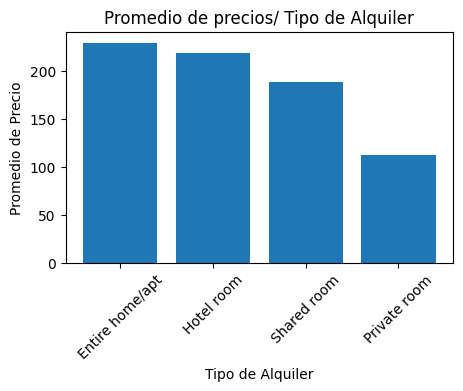

In [13]:
# - Promedio de precios por tipo de alquiler
room_price = d3.groupby('room_type')['price'].mean().round(2)
room_price1 = room_price.sort_values( ascending=False)
x = room_price1.index
y = room_price1.values
fig, ax = plt.subplots(figsize=(5, 3))
ax.bar(x, y, label='Promedio por tipo de Alquiler')


plt.title('Promedio de precios/ Tipo de Alquiler')
plt.xlabel('Tipo de Alquiler')
plt.ylabel('Promedio de Precio')
plt.xticks(rotation=45)

print(room_price1)

### Análisis univariado distribución de Tipo de alojamiento

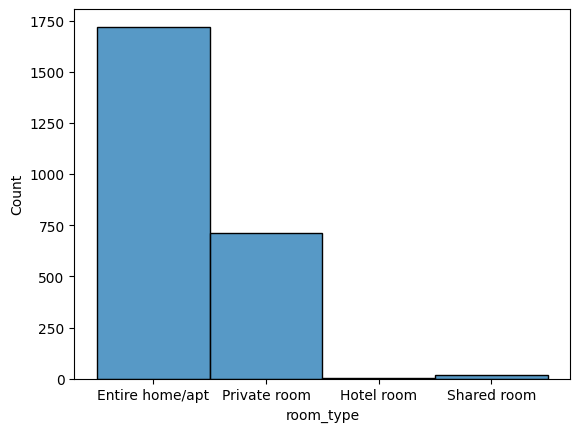

Entire home/apt    1720
Private room        711
Shared room          20
Hotel room            5
Name: room_type, dtype: int64


In [14]:

sns.histplot(d3['room_type'], kde=False)
plt.show()

count = d3['room_type'].value_counts()
print(count)

## 2.3 - Porcentajes de oferta segun la localidad:

Luego de conocer los precios promedios según el tipo de alquiler, es necesario conocer en qué localidades tienen mayor oferta dichos alquileres, lo que nos permite saber las ubicaciones donde mayor probabilidad de busquedas o interés de alquiler hay. Encontrando que:


***Porcentajes por Localidad***:

Manhattan        54.11 %

Brooklyn         37.83 %

Queens            6.27 %

Bronx             1.30 %

Staten Island     0.49 %

**Podemos notar que tanto en Manhattan como Brooklyn tienen la mayor cantidad de oferta de alquileres, indiferentemente de su tipo.**

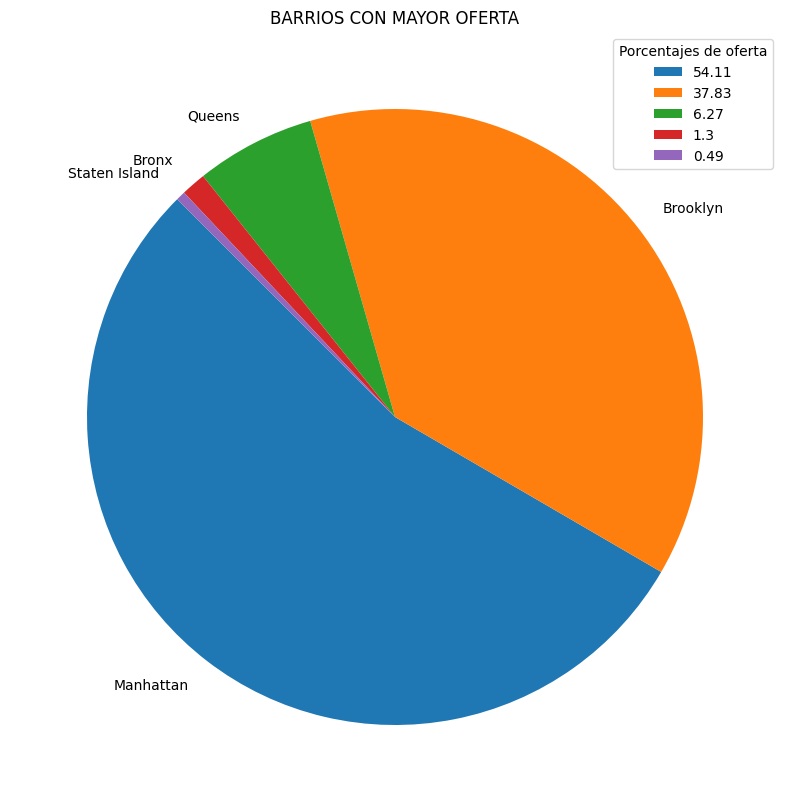

Manhattan        54.11
Brooklyn         37.83
Queens            6.27
Bronx             1.30
Staten Island     0.49
Name: neighbourhood_group, dtype: float64


In [15]:
# - Porcentaje de localidades con mas oferta
# Conteo de barrios totales del DataFrame d1

dist_barrios = d3['neighbourhood_group'].value_counts()

#Porcentajes
avg = d3['neighbourhood_group'].value_counts(normalize=True) * 100

avg1 = avg.round(2)
# Variables
x = avg1.index
y = avg1.values

plt.figure(figsize=(10, 10))
plt.pie(avg1, labels=x, startangle=135)
plt.subplots_adjust(left=0, right=0.85)
plt.gca().set_aspect('equal')

plt.legend(avg1, title='Porcentajes de oferta', bbox_to_anchor=(1, 1), loc='best')
plt.title('BARRIOS CON MAYOR OFERTA')

plt.show()
print(avg1)

### Analisis Univariado por Alojamiento

In [16]:
import plotly.express as px

fig = px.histogram(d3, x='neighbourhood_group', nbins=6)

#Atributos
fig.update_layout(

    title="Distribución por Alojamiento",

    # Eje x
    xaxis=dict(
        showgrid=False,
        showline=True,
        linecolor='rgb(102, 102, 102)',
        tickfont_color='rgb(102, 102, 102)',
        showticklabels=True,
        dtick=10,
        ticks='outside',
        tickcolor='rgb(102, 102, 102)',
    ),
    # Margen
    margin=dict(l=140, r=40, b=50, t=80),
    # Configuración de la leyenda
    legend=dict(
        font_size=10,
        yanchor='middle',
        xanchor='right',
    ),

    width=600,
    height=300,
    paper_bgcolor='white',
    plot_bgcolor='white',
    hovermode='closest',
)

fig.show()

## 2.3 - MEDIA DE PRECIOS SEGUN LA LOCALIDAD:

Analizando los siguientes resultados podemos ver que el tipo de alquiler de habitación de hotel ('Hotel room') solo se encuentra en la localidad de Brooklyn, mientras que el alquiler de habitación privada (Private room) y alquier entero (Entire home/apt) tienen mayor oferta en todas las localidades con promedios de precios más altos en este último, en las localidades de Manhattan y Brooklyn.

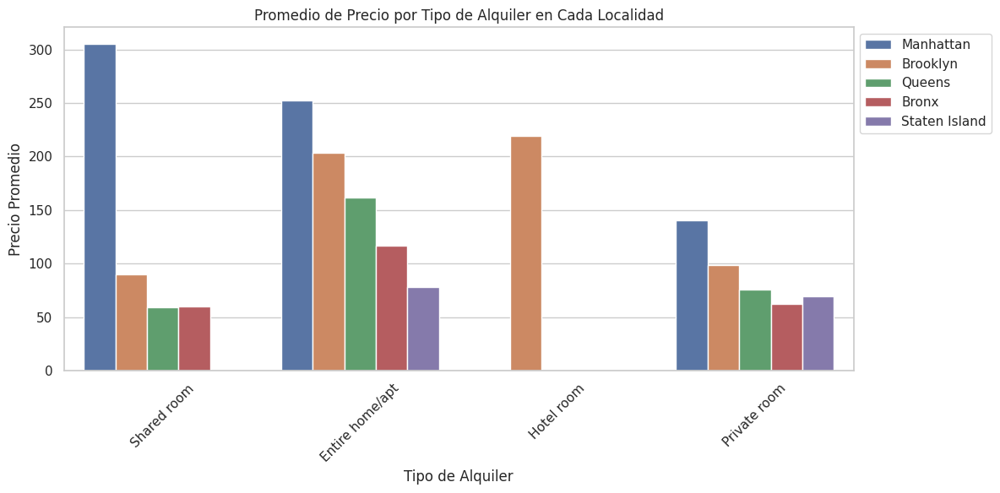

In [17]:
# - Promedio de precios por tipo de alquiler en cada localidad
prom_barrios = d3.groupby(['neighbourhood_group', 'room_type'])['price'].mean().reset_index()
prom_barrios1= prom_barrios.sort_values(by='price',ascending=False)
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x="room_type", y="price", hue="neighbourhood_group", data=prom_barrios1)


plt.title("Promedio de Precio por Tipo de Alquiler en Cada Localidad")
plt.xlabel("Tipo de Alquiler")
plt.ylabel("Precio Promedio")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')


plt.tight_layout()
plt.show()

## 2.4 - RELACION DEL PRECIO EN FUNCION A LOS DIAS DISPONIBLES:

### Analisis de correlación con una seleccion de columnas dentro del dataset, el objetivo es determinar relaciones entre variables ademas de la relacion del precio en funcion a los dias disponibles

<ipython-input-18-711eccf15b80>:8: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



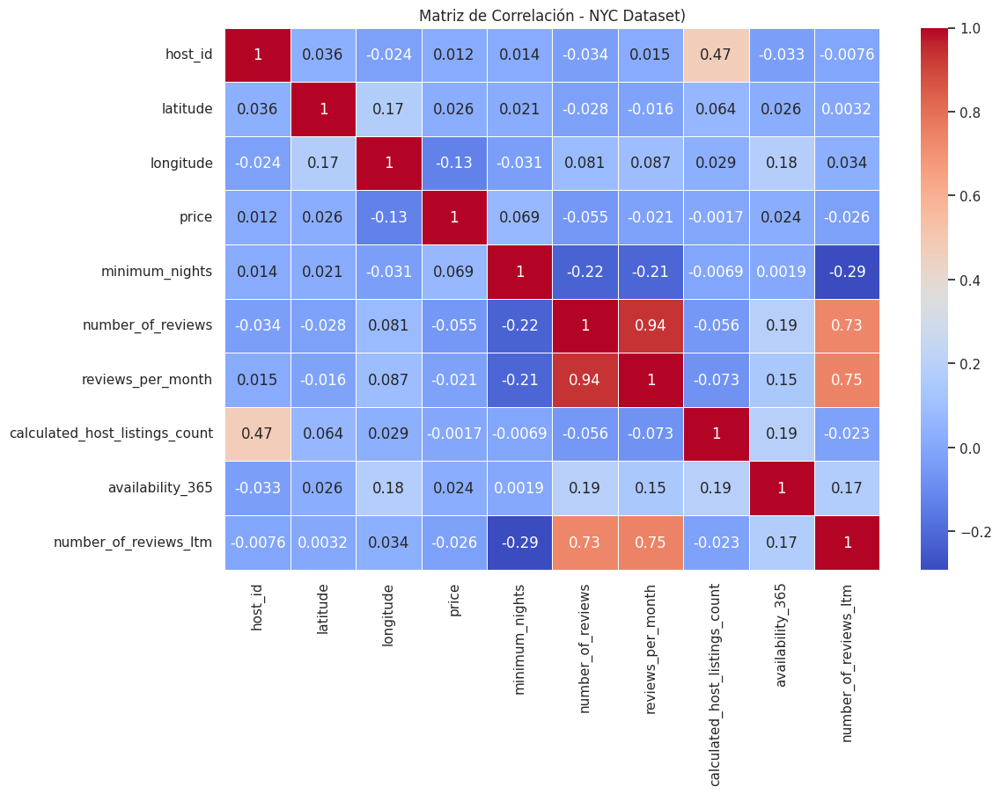

In [18]:
import matplotlib.pyplot as plt

#Filtrar las columnas medidas
columnas = ['id','name','host_id','host_name','neighbourhood_group','neighbourhood','latitude','longitude','room_type','price','minimum_nights','number_of_reviews','last_review','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
sub_d3 = d3[columnas]

# Calcula la matriz de correlación para el subconjunto de columnas
correlation_matrix = sub_d3.corr()

# Crea un heatmap para visualizar la matriz de correlación
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matriz de Correlación - NYC Dataset)")
plt.show()

In [19]:
sub_d3.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,2595,Skylit Midtown Castle,2.845000e+03,Jennifer,Manhattan,Midtown,40.7536,-73.9856,Entire home/apt,150.0000,30.0000,49.000,2022-06-21,0.3000,3.0000,314.0000,1.000
1,5121,BlissArtsSpace!,7.356000e+03,Garon,Brooklyn,Bedford-Stuyvesant,40.6854,-73.9551,Private room,60.0000,30.0000,50.000,2019-12-02,0.3000,2.0000,365.0000,0.000
2,5203,Cozy Clean Guest Room - Family Apt,7.490000e+03,MaryEllen,Manhattan,Upper West Side,40.8038,-73.9675,Private room,75.0000,2.0000,118.000,2017-07-21,0.7200,1.0000,0.0000,0.000
3,5178,Large Furnished Room Near B'way,8.967000e+03,Shunichi,Manhattan,Midtown,40.7646,-73.9832,Private room,68.0000,2.0000,575.000,2023-02-19,3.4100,1.0000,106.0000,52.000
4,"5136,""Large Sunny Brooklyn Duplex, Patio + Gar...",Loft Suite,5.924846e+06,The Box House Hotel,Manhattan,Williamsburg,40.7298,-73.9591,Entire home/apt,195.4192,24.5735,67.557,2023-01-01,0.6545,2.7079,118.5279,5.852


### Análisis Multivariado:

La mayor cantidad de correlacion se puede notar en los reviews, sin embargo, el análisis de estas variables no determinan una incidencia sobre el precio, esto es debido a que no corresponde a variables categoricas que nos permitan determinar si estos reviews son buenos o malos, independientemente de sus cantidades.

### Análisis Bivariado:
No obstante, se procede al análisis bivariado entre el previo y los dias disponibles para corroborar la correlación observada previamente.

Una vez identificados los tipos de alquiler con mayor oferta según el gráfico anterior, los cuales son: alquiler Entero y Habitación provada, otra variable en relacion al precio independientemente de su ubicación es la relación del precio en función a los dias disponible, para esto, se traza una linea de tendencia en un gráfico de dispersión que permite ver la relacion del precio en funcion del tiempo.


Sin embargo, se observa que no hay una relación que señale variabilidad del precio conforme los alquileres dispongan de mayor disponibilidad. Por lo que dicha relación no impactaría en la toma de desiciones.

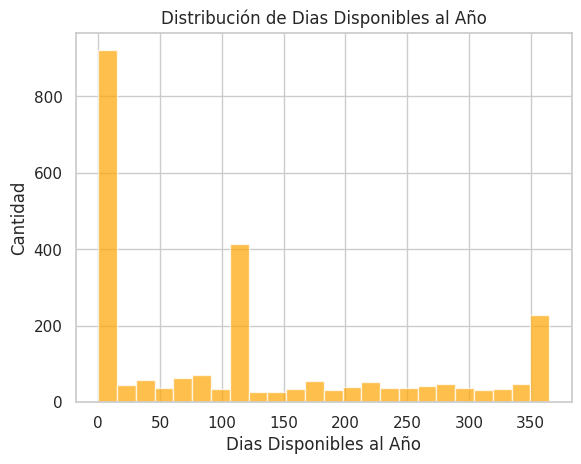

In [27]:
# Histograma
plt.hist(d3['availability_365'], bins=24, color='orange', alpha=0.7)

#Contexto del gráfico
plt.xlabel('Dias Disponibles al Año')
plt.ylabel('Cantidad')
plt.title('Distribución de Dias Disponibles al Año')
plt.show()

### Análisis Dias:

Se observa una distribución de días con ciertos outliers y promedios contenidos <25 dias, entre 100-120 dias y >350 dias.

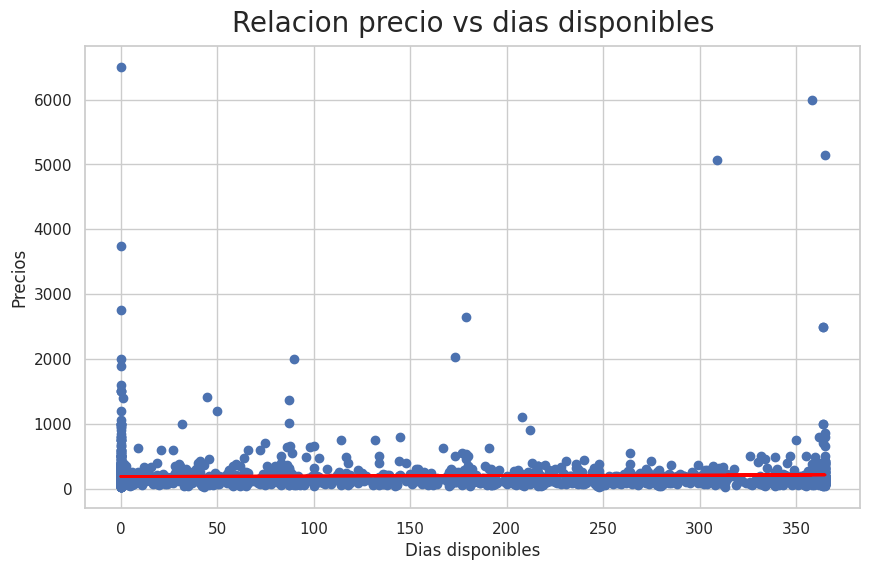

In [28]:
# Linea de tendencia de la relacion de precios vs dias disponibles
most_rent = d3[d3['room_type'].isin(['Entire home/apt', 'Private room'])]

dias = most_rent['availability_365']
precio = most_rent['price']

# Calculo de coeficientes
coefficients = np.polyfit(dias, precio, 1)
b, a = coefficients

#Línea de tendencia
trend_line = b * dias + a

plt.figure(figsize=(10, 6))
plt.scatter(dias, precio)
plt.plot(dias, trend_line, color='red', linewidth=2, label='Línea de Tendencia')

plt.title("Relacion precio vs dias disponibles", fontsize=20, verticalalignment='bottom');
plt.xlabel("Dias disponibles");
plt.ylabel("Precios");

## 2.5 - VARIABILIDAD DE PRECIOS SEGUN LOCALIDAD - ALOJAMIENO ENTERO Y HABITACIÓN ENTERA:

Podemos observar como las localidades de Manhattan y Brooklyn tienen mayor variedad de precios segun los tipos de alojamientos mencionados, los cuales superan los 1000 U$D en ambas localidades.

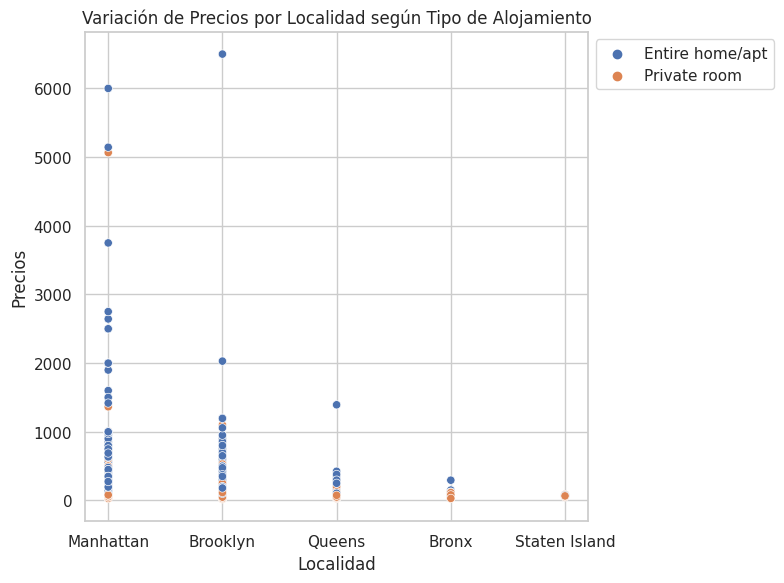

In [29]:
# - Relacion de precios segun localidad (Alojamiento entero, Habitacion privada)
plt.figure(figsize=(8, 6))

sns.scatterplot(data=most_rent, x='neighbourhood_group', y='price', hue = 'room_type')

plt.xlabel('Localidad')
plt.ylabel('Precios')
plt.title('Variación de Precios por Localidad según Tipo de Alojamiento')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')


plt.tight_layout()
plt.show()


## 2.6 - RANGO DE PRECIOS SEGUN CADA BARRIO EN LAS LOCALIDADES DE MANHATTAN Y BROOKLYN:

Una vez determinado que las localidades de Manhattan y Brooklyn son aquellas con mayor oferta para los tipos de alojamiento entero y habitación privada, es necesario conocer el rango de precios segun cada barrio para estas localidades seleccionadas, obteniendo los siguientes resultados:

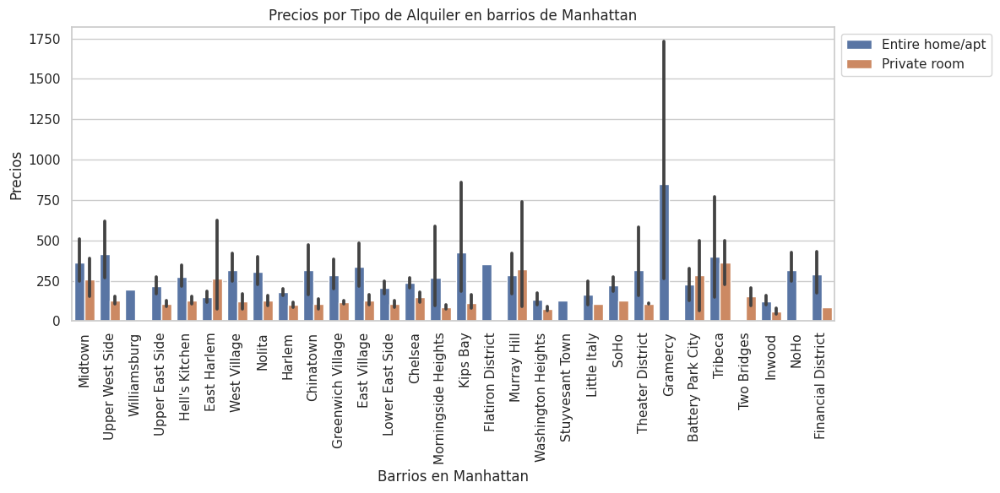

In [30]:
# - Precios por tipo de alquiler en los barrios de las localidades con mayor oferta: MANHATTAN

most_rent_m = most_rent[most_rent['neighbourhood_group'].isin(['Manhattan'])]
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x="neighbourhood", y="price", hue="room_type", data=most_rent_m)
most_rent_mi = most_rent_m['neighbourhood'].value_counts()


plt.xlabel('Barrios en Manhattan')
plt.ylabel('Precios')
plt.title('Precios por Tipo de Alquiler en barrios de Manhattan')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')


plt.tight_layout()
plt.show()


***Precios por tipo de alquiler en los barrios de Manhattan:***

Dentro de la localidad de Manhattan los barrios con mayor oferta de alquiler mayor igual a 50 ofertas son:


Harlem:                 157

Upper West Side:        103

East Village:            97

Upper East Side:         82

Chelsea:                 55

Hell's Kitchen:          54

East Harlem:             50

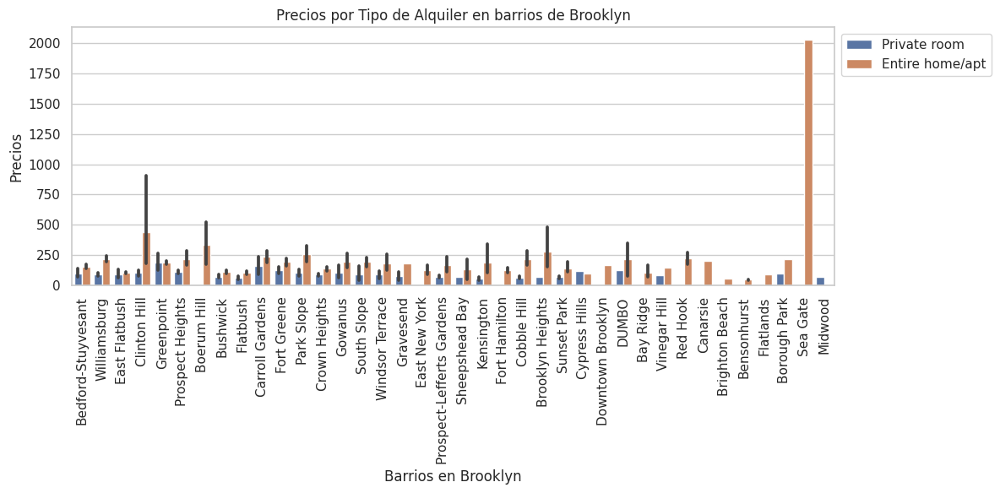

In [31]:
#Relacion de precio por barrio primero en Brooklyn

most_rent_b = most_rent[most_rent['neighbourhood_group'].isin(['Brooklyn'])]
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x="neighbourhood", y="price", hue="room_type", data=most_rent_b)
most_rent_bi = most_rent_b['neighbourhood'].value_counts()

plt.xlabel('Barrios en Brooklyn')
plt.ylabel('Precios')
plt.title('Precios por Tipo de Alquiler en barrios de Brooklyn')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')


plt.tight_layout()
plt.show()


***Precios por tipo de alquiler en los barrios de Brooklyn:***

Dentro de la localidad de Brooklyn los barrios con mayor oferta de alquiler igual o por encima de 50 ofertas son:

Williamsburg:                185

Bedford-Stuyvesant:           155

Greenpoint:                    80

Crown Heights:                 68

Bushwick:                      50